## Welcome to part 2 of the workshop.
##### Here, we will delve into essential packages you need to get started with using Julia for your own projects.

# STANDARD LIBRARY PACKAGES

## Random.jl
https://docs.julialang.org/en/v1/stdlib/Random/

This package includes basic functions to deal with random numbers

In [1]:
using Random

In [2]:
# First, we can set the seed for the random number generator with

Random.seed!(0)

TaskLocalRNG()

In [5]:
# 'rand' generates random floats between 0 and 1

display(rand(5))
display(rand(3, 3))

5-element Vector{Float64}:
 0.890973290024772
 0.1312913304915746
 0.30214998648673186
 0.6429357223116097
 0.08367802980395722

3×3 Matrix{Float64}:
 0.0918216  0.674938  0.666875
 0.412154   0.858819  0.0461659
 0.397861   0.768534  0.297108

In [7]:
# It can also be used to generate random numbers from a specified collection

println(rand(1:3, 5)) # 5 random numbers from [1, 2, 3]

[3, 1, 1, 2, 1]


In [10]:
# 'bitrand' is used to generate an array of 1s and 0s 

a = bitrand(5)
println(a)

# We can use this array to index another.
# This essentially selects elements of the array with 50% chance

b = [1, 2, 3, 4, 5]
println(b[a])

Bool[1, 1, 0, 0, 1]
[1, 2, 5]


In [13]:
# 'randn' works like 'rand' but generates normally-distributed samples
# 'randexp' works like 'rand' but generates exponentially-distributed samples
# 'randstring' generates a random string

println(randn(5))
println(randexp(5))
println(randstring(10))
println(randstring('a':'z', 10))

[-0.13519814466885657, -0.48425106296485515, -1.1082407898353104, 2.6525758239223, 0.795774589920222]
[2.1847945660919077, 4.477937007811173, 0.5508708462197004, 0.03404195229462651, 0.6325562621223899]
4pN0391Gwm
fccowjsqvu


In [16]:
# 'ransubseq' generates a random subsequence of a given array with a probability p
# This essentially subsamples your array

p = 0.5 #(include each element with 50% probability)
println(randsubseq(1:5, p))

[1, 2]


In [18]:
# 'randperm' gives a random permutation of a given length.
# This permutation can be used to index an array to shuffle it.

a = ["first", "second", "third", "fourth", "fifth"]
b = randperm(5)
println(b)
println(a[b]) #(shuffled array)

[3, 1, 2, 4, 5]
["third", "first", "second", "fourth", "fifth"]


In [20]:
# 'shuffle' randomly shuffles your array
# use 'shuffle!' if you want to do this in place

a = ["first", "second", "third", "fourth", "fifth"]
shuffle(a)
shuffle!(a)

5-element Vector{String}:
 "second"
 "first"
 "fourth"
 "fifth"
 "third"

## Dates.jl

https://docs.julialang.org/en/v1/stdlib/Dates/

This package allows us to format dates/times. I find it most useful to measure time

In [21]:
using Dates

first_time = now()

2024-05-22T12:30:08.336

In [22]:
now() - first_time

13299 milliseconds

## Logging.jl

https://docs.julialang.org/en/v1/stdlib/Logging/

This package is a better way to debug your code than just using `println` statements.
`@info`, `@warn`, `@error` are all ways to display custom messages.

In [28]:
A = rand(3, 3)
@info "The sum of elements in the matrix is" A sum(A)

A = rand(100, 100)
@warn "The matrix is quite big" size(A)

A[10, 10] = 1000000
@error "The matrix has large values" maximum(A)

┌ Info: The sum of elements in the matrix is
│   A = [0.3345926937871829 0.11016084999810893 0.38906467789365184; 0.08084457543673984 0.8335718471244933 0.9017199547718903; 0.8379463104110916 0.46985956902794834 0.0515473677959446]
│   sum(A) = 4.009307846247052
└ @ Main /Users/jeroen/Documents/PhD projects/talks/Julia workshop/julia-workshop/everything_you_need_to_get_started.ipynb:2
┌ Warning: The matrix is quite big
│   size(A) = (100, 100)
└ @ Main /Users/jeroen/Documents/PhD projects/talks/Julia workshop/julia-workshop/everything_you_need_to_get_started.ipynb:5
┌ Error: The matrix has large values
│   maximum(A) = 1.0e6
└ @ Main /Users/jeroen/Documents/PhD projects/talks/Julia workshop/julia-workshop/everything_you_need_to_get_started.ipynb:8


## Statistics.jl

https://docs.julialang.org/en/v1/stdlib/Statistics/

This package provides basic stats tools

In [29]:
using Statistics

In [32]:
# The functions below compute the mean, media, standard deviation, and variance of a collection of numbers.

a = randn(100)
println(mean(a))
println(median(a))
println(std(a))
println(var(a))

-0.11635348656886273
-0.10302790775205875
0.8862385140964445
0.7854187038678738


In [33]:
# 'cov' returns the covariance between two vectors
# 'cor' returns the Pearson correlation between two vectors

b = a + randn(100)*10
println(cov(a, b))

b = a + 0.1*rand(100)  # High correlation
println(cor(a, b))

1.4102770034185268
0.9995557987845738


In [35]:
# 'quantile' calculates the quantiles of a set of numbers at given percentiles.
# The code below calculates the 2.5% and 97.5% quantiles.

a = randn(100000)
quantile(a, [0.025, 0.975])

2-element Vector{Float64}:
 -1.9704495973755694
  1.9533941471043739

## LinearAlgebra.jl

https://docs.julialang.org/en/v1/stdlib/LinearAlgebra/

This package provides useful linear algebra operators

In [36]:
using LinearAlgebra

In [55]:
# 'inv', 'tr' and 'det' implement the trace, determinant, and inverse of a matrix

Random.seed!(0)
A = rand(1:3, 3, 3)
display(A)
display(inv(A))
println(tr(A))
println(det(A))

3×3 Matrix{Int64}:
 2  1  1
 1  2  3
 3  1  1

3×3 Matrix{Float64}:
 -1.0   2.77556e-17   1.0
  8.0  -1.0          -5.0
 -5.0   1.0           3.0

5
0.9999999999999998


In [41]:
# To get the transpose, use an apostrophe (A') or 'transpose':

Aᵀ = A'
transpose(A)

3×3 transpose(::Matrix{Int64}) with eltype Int64:
 2  1  3
 1  2  1
 1  3  1

In [44]:
# To use basic operators element-wise, use the broadcasting operator '.'

sin.(A)
cos.(A)
log.(A)
A .^ 2
A ./ 2

3×3 Matrix{Float64}:
 1.0  0.5  0.5
 0.5  1.0  1.5
 1.5  0.5  0.5

In [45]:
# The matrix product is obtained simply with '*'

A * A != A .* A

true

In [47]:
# The eigenvalues and eigenvectors can be obtained with 'eigvals' and 'eigvecs'

println(eigvals(A))
eigvecs(A)

ComplexF64[0.08201204045934006 - 0.44727789990956635im, 0.08201204045934006 + 0.44727789990956635im, 4.835975919081321 + 0.0im]


3×3 Matrix{ComplexF64}:
 -0.155794+0.12269im   -0.155794-0.12269im   0.442348+0.0im
  0.836651-0.0im        0.836651+0.0im        0.72067+0.0im
 -0.482965-0.165635im  -0.482965+0.165635im  0.533819+0.0im

In [48]:
# The svd decomposition can be obtained using 'svd'

U, Λ, Vᵀ = svd(A)

SVD{Float64, Float64, Matrix{Float64}, Vector{Float64}}
U factor:
3×3 Matrix{Float64}:
 -0.464142   0.273369  -0.842521
 -0.658103  -0.743069   0.121447
 -0.592851   0.610834   0.524794
singular values:
3-element Vector{Float64}:
 5.113090584324951
 2.2019117766787084
 0.08882119235375702
Vt factor:
3×3 Matrix{Float64}:
 -0.658103  -0.464142  -0.592851
  0.743069  -0.273369  -0.610834
  0.121447  -0.842521   0.524794

In [49]:
# 'pinv' computes the pseudo-inverse

B = rand(1:3, 2, 5)
pinv(B)

5×2 Matrix{Float64}:
 -0.140625   0.21875
  0.359375  -0.28125
  0.03125    0.0625
  0.046875   0.09375
 -0.140625   0.21875

In [50]:
# 'dot' computes the dot product between two vectors (can also use \cdot):
# 'cross' computes the cross product between two vectors:
# 'diagm' turns a vector into a matrix with that vector on its diagonal:
# 'diag' returns the diagonal of a matrix as a vector:

a = [1, 2, 3]
b = [-2, -4, -6]
dot(a, b)

display(a ⋅ b)
display(cross(a, b))
display(diagm(a))
display(diag(A))

-28

3-element Vector{Int64}:
 0
 0
 0

3×3 Matrix{Int64}:
 1  0  0
 0  2  0
 0  0  3

3-element Vector{Int64}:
 2
 2
 1

In [51]:
# The variable 'I' is usually reserved for the identity matrix, which in Julia is called 'UniformScaling'

I
I*A == A*I == A

true

In [57]:
# To take the square root of a matrix, we can use 'sqrt', or 'cholesky'.

A = a * a'
sqrt(A)
cholesky(A)

PosDefException: PosDefException: matrix is not positive definite; Cholesky factorization failed.

In [59]:
# You can only take the cholesky decomposition if your matrix is positive definite.
# To check for this, use 'isposdef'
# Similarly, 'issymmetric' tests whether the matrix is symmetric

println(isposdef(A))
println(issymmetric(A))
AA = (a * a') + 2I
println(isposdef(AA))
cholesky(AA)

false
true
true


Cholesky{Float64, Matrix{Float64}}
U factor:
3×3 UpperTriangular{Float64, Matrix{Float64}}:
 1.73205  1.1547   1.73205
  ⋅       2.16025  1.85164
  ⋅        ⋅       2.13809

In [61]:
# The rank of a matrix is unsurprisingly computed using 'rank':
# The p-norm for a vector/matrix is computed using 'norm':
# To normalize a vector, use 'normalize':
# Get the nullspace of a matrix with 'nullspace':

println(rank(A))
println(norm(A))
println(norm(a))
println(norm(a, 1)) #(this calculates the 1-norm)
println(normalize(a))
nullspace(B)

1
14.0
3.7416573867739413
6.0
[0.2672612419124244, 0.5345224838248488, 0.8017837257372732]


5×3 Matrix{Float64}:
 -0.392456   -0.588684   -0.45006
 -0.226528   -0.339793    0.190659
  0.86656    -0.200159   -0.146661
 -0.200159    0.699761   -0.219991
 -0.0606009  -0.0909013   0.831378

# CODING TOOLS

## ProgressMeter.jl

(https://github.com/timholy/ProgressMeter.jl)

In [65]:
using Pkg
Pkg.add("ProgressMeter")
using ProgressMeter

   Resolving package versions...
  No Changes to `~/.julia/environments/v1.10/Project.toml`
  No Changes to `~/.julia/environments/v1.10/Manifest.toml`


In [66]:
# '@showprogress' works like tqdm in Python, and shows the progress of loops

a = 0
@showprogress for i in 1:10_000_000
    a += 1
end


Progress: 100%|█████████████████████████████████████████| Time: 0:00:11


In [68]:
# If you wish to set a custom description and update interval:

a = 0
@showprogress dt=1 desc="Computing..." for i in 1:10_000_000
    a += 1
end

Computing... 100%|███████████████████████████████████████| Time: 0:00:10


In [77]:
# You can also change the color and glyphs that are used and show the speed of iteration:

a = 0
@showprogress barglyphs=BarGlyphs("[=> ]") barlen=50 color=:yellow showspeed=true for i in 1:1_000_000
    a += 1
end

Progress: 100%[==================================================] Time: 0:00:01 ( 1.10 μs/it)


In [76]:
# You can use a spinner too if your progress is of unknown length:

prog = ProgressUnknown(desc="Burning the midnight oil:", spinner=true)

a = 0
for i in 1:10_000_000
    next!(prog, spinner="🌑🌒🌓🌔🌕🌖🌗🌘")
    a += 1
end



🌗 Burning the midnight oil:    Time: 0:00:08

## BenchmarkTools.jl

https://juliaci.github.io/BenchmarkTools.jl/stable/

This package lets you find out how fast your functions run.

use the `@btime` macro before your function, and the time taken, as well as memory allocations will be displayed.

`@btime` will run your function many times to get a good estimate, so it will take a while depending on your function

In [78]:
Pkg.add("BenchmarkTools")
using BenchmarkTools

   Resolving package versions...
  No Changes to `~/.julia/environments/v1.10/Project.toml`
  No Changes to `~/.julia/environments/v1.10/Manifest.toml`


In [82]:
"""
    fib_memo(n)

Compute n'th Fibonacci number using memoization
"""
function fib_memo(n)
    known = zeros(BigInt, n)
    function memoize(k)
        if known[k] != 0
            # do nothing
        elseif k == 1 || k == 2
            known[k] = 1
        else
            known[k] = memoize(k-1) + memoize(k-2)
        end
        return known[k]
    end
    return memoize(n)
end

fib_memo(1000) # These numbers get big

43466557686937456435688527675040625802564660517371780402481729089536555417949051890403879840079255169295922593080322634775209689623239873322471161642996440906533187938298969649928516003704476137795166849228875

In [83]:
@btime fib_memo(1000) # It takes Julia mere microseconds to compute even huge numbers like these!

  190.292 μs (3470 allocations: 116.18 KiB)


In [84]:
# You can use @benchmark to get some more info.

@benchmark fib_memo(1000)

BenchmarkTools.Trial: 10000 samples with 1 evaluation.
 Range (min … max):  190.416 μs … 51.952 ms  ┊ GC (min … max): 0.00% … 34.68%
 Time  (median):     201.645 μs              ┊ GC (median):    0.00%
 Time  (mean ± σ):   267.847 μs ±  1.681 ms  ┊ GC (mean ± σ):  7.81% ±  1.25%

   ▃██▆▅▂                                                       
  ▄███████▇▆▄▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁ ▂
  190 μs          Histogram: frequency by time          321 μs <

 Memory estimate: 116.18 KiB, allocs estimate: 3470.

In [85]:
# If you have more expensive functions, you can simply use @time or @elapsed if you want to store the value
# These estimates are not as trust-worthy as the ones from @btime and @benchmark

@time fib_memo(1000);
time_taken = @elapsed fib_memo(1000)

  0.000234 seconds (3.47 k allocations: 116.180 KiB)


0.000224042

# FILE SAVING/LOADING

## FileIO.jl

https://juliaio.github.io/FileIO.jl/stable/

This package interfaces with a number of file formats (https://juliaio.github.io/FileIO.jl/stable/registry/)

Use `save` and `load` to read and write data

In [86]:
Pkg.add("FileIO")
using FileIO

   Resolving package versions...
  No Changes to `~/.julia/environments/v1.10/Project.toml`
  No Changes to `~/.julia/environments/v1.10/Manifest.toml`


## JLD2.jl

https://juliaio.github.io/JLD2.jl/dev/

To save Julia variables, `JLD2` is the gold standard, and works similar to Python's pickle

In [87]:
Pkg.add("JLD2")
using JLD2

data = Dict{String, Vector{Int}}("1A3CD" => [1, 4, 2, 4, 5], "2HD7E" => [6, 4, 3, 8, 2], "F4JK3" => [0, 4, 4, 5, 5])
save("data.jld2", data)
data2 = load("data.jld2")

   Resolving package versions...
  No Changes to `~/.julia/environments/v1.10/Project.toml`
  No Changes to `~/.julia/environments/v1.10/Manifest.toml`


Dict{String, Any} with 3 entries:
  "F4JK3" => [0, 4, 4, 5, 5]
  "2HD7E" => [6, 4, 3, 8, 2]
  "1A3CD" => [1, 4, 2, 4, 5]

## NPZ.jl

https://fhs.github.io/NPZ.jl/dev/

If you want to load arrays saved from numpy in `.npy` format, use `NPZ`

In [88]:
Pkg.add("NPZ")
using NPZ

a = rand(100);
save("data.npy", a)
b = load("data.npy")
a == b

   Resolving package versions...
    Updating `~/.julia/environments/v1.10/Project.toml`
  [15e1cf62] + NPZ v0.4.3
    Updating `~/.julia/environments/v1.10/Manifest.toml`
  [15e1cf62] + NPZ v0.4.3
  [a5390f91] + ZipFile v0.10.1
Precompiling project...
  ✓ ZipFile
  ✓ NPZ
  2 dependencies successfully precompiled in 2 seconds. 481 already precompiled. 1 skipped during auto due to previous errors.


true

## CSV.jl

https://csv.juliadata.org/stable/

In [101]:
# For .csv files, it makes most sense to load them directly into DataFrames (we will cover these later)

Pkg.add(["CSV", "DataFrames"]);
using CSV, DataFrames

CSV.write("data.csv", data)
data2 = CSV.read("data.csv", DataFrame)
data2

   Resolving package versions...
  No Changes to `~/.julia/environments/v1.10/Project.toml`
  No Changes to `~/.julia/environments/v1.10/Manifest.toml`


Row,F4JK3,2HD7E,1A3CD
,Int64,Int64,Int64
1,0,6,1
2,4,4,4
3,4,3,2
4,5,8,4
5,5,2,5


## RData.jl

https://github.com/JuliaData/RData.jl

To read/write `.rda`/`.rdata` files, use `RData`

In [104]:
# CANT WRITE TO .rda FILES. ONLY USE THIS IF YOU HAVE SOME .rda FILE YOU WANT TO READ

    # Pkg.add("RData")
    # using RData

    # data2 = load("data.rda")

In [105]:
# .txt files can be read directly using 'readlines'
# If it contains data in numericals, use 'parse' followed by either Int64 or Float64

a = readlines("data.txt")

2-element Vector{String}:
 "This is a text file"
 "Nothing special here"

## MAT.jl

https://juliaio.github.io/MAT.jl/stable/methods/

To read/write `.mat` files, use `MAT` (doesn't interface with `FileIO`)

In [108]:
Pkg.add("MAT")
using MAT

matwrite("data.mat", Dict("A" => rand(10, 10), "a" => randn(20)); version="v7.3") #(version specifies MATLAB version)
vars = matread("data.mat")
size(vars["A"])

   Resolving package versions...
  No Changes to `~/.julia/environments/v1.10/Project.toml`
  No Changes to `~/.julia/environments/v1.10/Manifest.toml`


(10, 10)

## JSON.jl

https://github.com/JuliaIO/JSON.jl

To read/write `.json` files, use `JSON` (doesn't interface with FileIO)

In [109]:
Pkg.add("JSON")
using JSON

   Resolving package versions...
  No Changes to `~/.julia/environments/v1.10/Project.toml`
  No Changes to `~/.julia/environments/v1.10/Manifest.toml`


In [110]:
# You first have to convert your dict to a json string using 'JSON.json'

json_string = JSON.json(data)

"{\"F4JK3\":[0,4,4,5,5],\"2HD7E\":[6,4,3,8,2],\"1A3CD\":[1,4,2,4,5]}"

In [111]:
# Now we can use the general file opening functionality that we have been avoiding
# by using FileIO

open("data.json","w") do f 
    write(f, json_string) 
end

61

In [112]:
# 'JSON.parsefile' reads a .json file

data2 = JSON.parsefile("data.json")
data2 == data

true

# PLOTTING

There are a number of plotting packages
- Plots.jl - The default, most documented package, what we'll be using - (https://docs.juliaplots.org/stable/)
- Makie.jl - A newer alternative that has a lot to offer - (https://docs.makie.org/stable/)
- Plotly.jl - Originally for JavaScript plotting - (https://plotly.com/julia/getting-started/)
- Gladfly.jl - Most like seaborn and ggplot - (https://gadflyjl.org/stable/)

In [113]:
Pkg.add("Plots")
using Plots

   Resolving package versions...
  No Changes to `~/.julia/environments/v1.10/Project.toml`
  No Changes to `~/.julia/environments/v1.10/Manifest.toml`


## BASIC PLOTTING

`Plots.jl` does almost all of its work through keyword arguments on the base `plot` function. 

To plot a single series of data, simply put the data into `plot`.

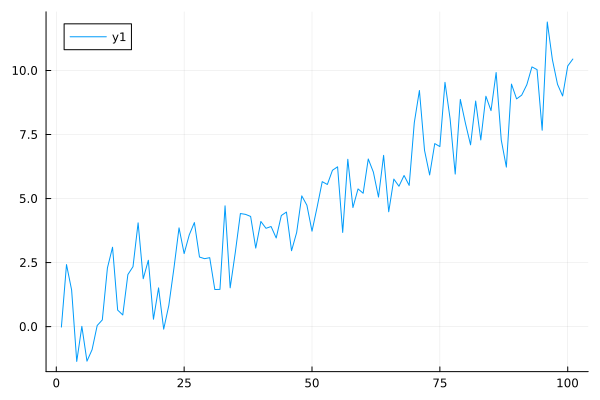

In [114]:
x = collect(0:0.1:10)
y = x + randn(length(x))
plot(y)

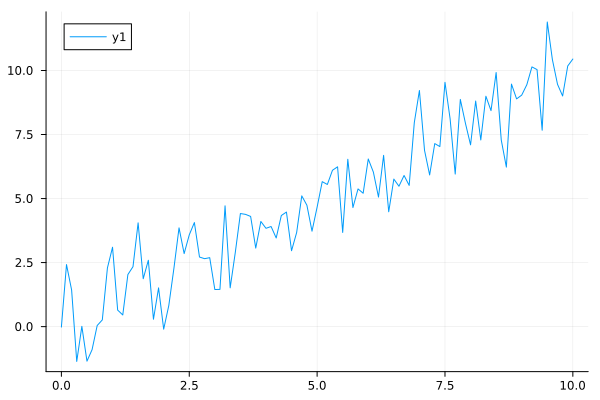

In [140]:
# You can also specify which x points to plot at
# I personally prefer the ticks on the outside

plot(x, y, tick_direction=:out)

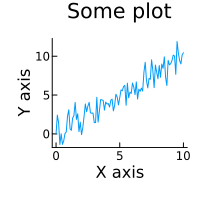

In [151]:
# Specify the size of your plot with 'size' (by default in pt measure, width first then height)
# I generally don't like the grid and the label for a single series. You can get rid of these using the 'label' and 'grid' keyword arguments
# You can specify axis labels and titles using 'xlabel', 'ylabel' and 'title'
# x and y ticks can be specified using the 'xticks' and 'yticks' arguments

plot(x, y, size=(200, 200), label="", grid=false, xlabel="X axis", ylabel="Y axis", title="Some plot", xticks=[0, 5, 10], yticks=[0, 5, 10])

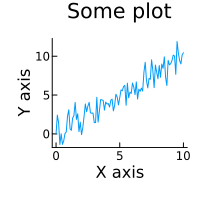

In [152]:
# As you can tell, this plot line is getting rather long.
# This is nice since it is all contained in one command, but can get arduous to look at.
# If you prefer, you can split up the function like so:

plot(x, y, 
    xticks=[0, 5, 10], yticks=[0, 5, 10], 
    size=(200, 200), 
    xlabel="X axis", ylabel="Y axis", title="Some plot", 
    label="", grid=false)

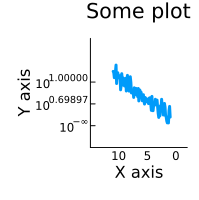

In [160]:
# If you want to change what is displayed on the xticks, but not where they're shown, use:
# The limits for the axes can be specified with xlim and ylim:
# 'linewidth' sets the width of the line
# You can choose to flip the x or y axes with 'xflip' and 'yflip':
# You can also change the scale from linear to logarithmic

plot(x .+ 1, y .+ 2, # make non negative for log 
    xscale=:identity, yscale=:log10,
    xflip=true, yflip=false,
    linewidth=3,
    xlim=(-2, 15), ylim=(-5, 20),
    xticks=[0, 5, 10], yticks=[0, 5, 10], 
    size=(200, 200), 
    xlabel="X axis", ylabel="Y axis", title="Some plot", 
    label="", grid=false)

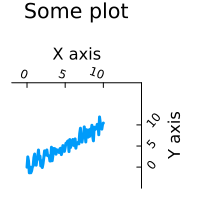

In [162]:
# Alternatively, you can choose whether to display the axes on the other side of the figure with 'xmirror' and 'ymirror'
# You can also rotate the ticks (in degrees) with 'xrotation' and 'yrotation'

plot(x, y, 
    xrotation=-20, yrotation=50,
    xmirror=true, ymirror=true,
    xflip=false, yflip=false,
    linewidth=3,
    xlim=(-2, 15), ylim=(-5, 20),
    xticks=[0, 5, 10], yticks=[0, 5, 10], 
    size=(200, 200), 
    xlabel="X axis", ylabel="Y axis", title="Some plot", 
    label="", grid=false)

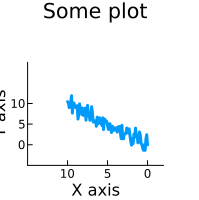

In [158]:
# Sometimes, there will be unwanted whitespace below/above/left/right of your plots.
# You can manage margins using:
# (The example below is purposefully bad)

plot(x, y, 
    xflip=true, yflip=false,
    linewidth=3,
    xlim=(-2, 15), ylim=(-5, 20),
    xticks=[0, 5, 10], yticks=[0, 5, 10], 
    size=(200, 200), 
    xlabel="X axis", ylabel="Y axis", title="Some plot", 
    label="", grid=false,
    bottom_margin=-10Plots.pt, top_margin=20Plots.pt, 
    left_margin=-15Plots.pt, right_margin=20Plots.pt)

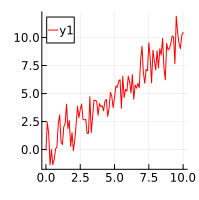

In [131]:
# 'color' uses Colors.jl to specify the color of the series.
# For a list of colors, check: https://juliagraphics.github.io/Colors.jl/stable/namedcolors/

plot(x, y, c=:red, size=(200, 200))

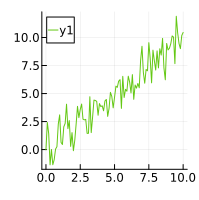

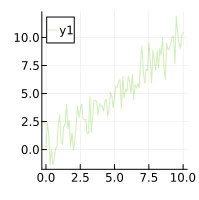

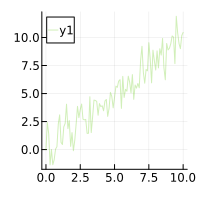

In [133]:
# If you want to use your own rgb color, use 'rgb' in a string 
# or with alpha value 'rgba' or with keyword 'alpha'

display(plot(x, y, c="rgb(100, 200, 20)", size=(200, 200)))
display(plot(x, y, c="rgb(100, 200, 20, 0.3)", size=(200, 200)))
display(plot(x, y, c="rgb(100, 200, 20)", alpha=0.3, size=(200, 200)))

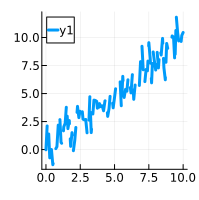

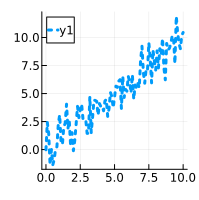

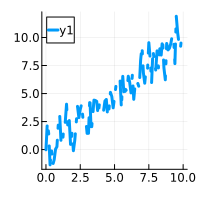

In [161]:
# You can change the linestyle to:

display(plot(x, y, linestyle=:dash, linewidth=3, size=(200, 200)))
display(plot(x, y, linestyle=:dot, linewidth=3, size=(200, 200)))
display(plot(x, y, linestyle=:dashdot, linewidth=3, size=(200, 200)))

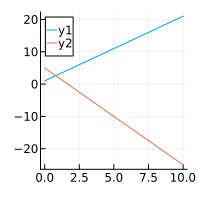

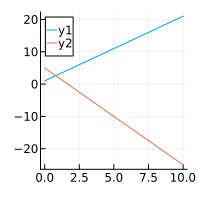

In [143]:
# If you want to plot multiple series, you can either form a matrix
# Or you can make two plot statements
# For the latter, we use the '!' notation, which adds on top of the existing figure.

y1 = 1 .+ 2*x
y2 = 5 .- 3*x
display(plot(x, [y1 y2], size=(200, 200)))

plot(x, y1, size=(200, 200))
plot!(x, y2, size=(200, 200))

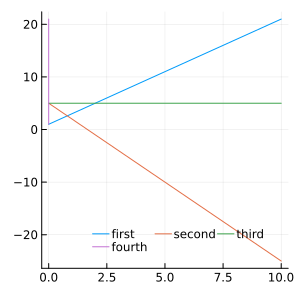

In [164]:
# You can make the legend box transparent with:

plot(x, y1, label="first", background_color_legend=nothing, foreground_color_legend=nothing, size=(300, 300))
plot!(x, y2, label="second")

# To position the legend elsewhere, use 'legend_position'

y3 = 5 .- 0*x
plot!(x, y3, label="third", legend_position=:bottomright)

# You can also change the layout of the legend elements by using 'legendcolumns'

x2 = 0*x
plot!(x2, y1, label="fourth", legendcolumns=3)

If you want to use subplots instead of having everything on the same plot, you can use layout to specify how many subplots there should be. You then specify with `sp` on which subplot things should go. 

I usually write one `plot` line to lay everything out, and then use a bunch of `plot!` to do everything on the subplots.

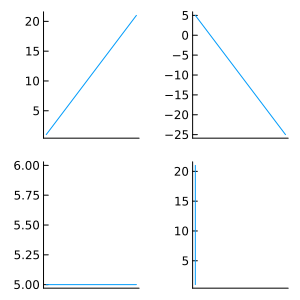

In [147]:
plot(layout=(2, 2), xticks=[], legend=false, grid=false, size=(300, 300))
plot!(x, y1, sp=1)
plot!(x, y2, sp=2)
plot!(x, y3, sp=3)
plot!(x2, y1, sp=4)

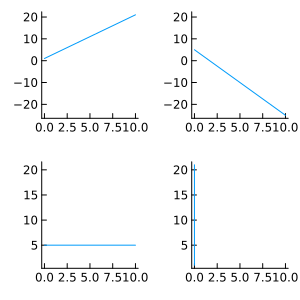

In [148]:
# You can link the axes so that they are matched in scale
# (either match x axes by column, or y axes by row, or both)

plot(layout=(2, 2), link=:both, legend=false, grid=false, size=(300, 300))
plot!(x, y1, sp=1)
plot!(x, y2, sp=2)
plot!(x, y3, sp=3)
plot!(x2, y1, sp=4)

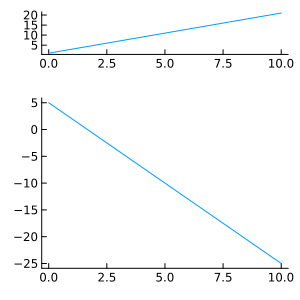

In [149]:
# You can also specify how big each subplot is

plot(layout=grid(2, 1, heights=[0.2, 0.8]), link=:both, legend=false, grid=false, size=(300, 300))
plot!(x, y1, sp=1)
plot!(x, y2, sp=2)

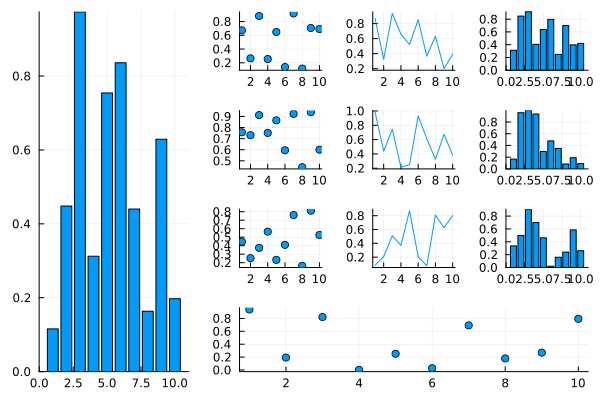

In [150]:
# More advanced layouts are also possible

l = @layout [a{0.3w} [grid(3,3)
             b{0.2h}  ]]
plot(rand(10, 11), layout=l, legend=false, seriestype=[:bar :scatter :path])

## ALTERNATE PLOTS

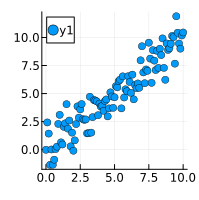

In [165]:
# To make a scatter plot, you can use either:
plot(x, y, seriestype=:scatter, size=(200, 200))
scatter(x, y, size=(200, 200))

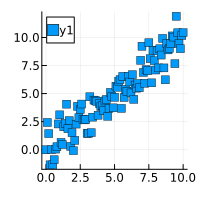

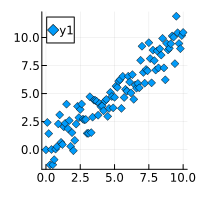

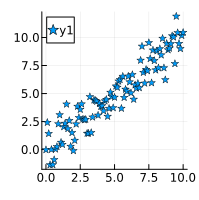

In [167]:
# You can change the marker shape
# Choose from [:none, :auto, :circle, :rect, :star5, :diamond, :hexagon, :cross, :xcross, :utriangle, :dtriangle, :rtriangle, :ltriangle, :pentagon, :heptagon, :octagon, :star4, :star6, :star7, :star8, :vline, :hline, :+, :x]

display(scatter(x, y, markershape=:rect, size=(200, 200)))
display(scatter(x, y, markershape=:diamond, size=(200, 200)))
display(scatter(x, y, markershape=:star5, size=(200, 200)))

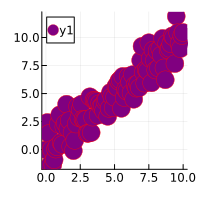

In [168]:
# Change the size, color, and border:

scatter(x, y, markersize=10, markercolor=:purple, markerstrokecolor=:red, size=(200, 200))

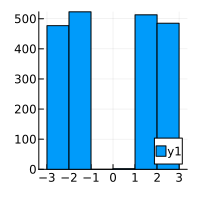

In [169]:
# To make a histogram, simply use 'histogram'

x = [0.3*randn(1000) .- 2..., 0.3*randn(1000) .+ 2...]
histogram(x, size=(200, 200))

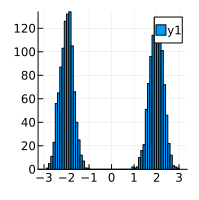

In [170]:
# This histogram is too coarse, use bins to get finer

histogram(x, bins=100, size=(200, 200))

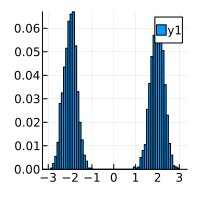

In [171]:
# If you want to normalize the histogram

histogram(x, bins=100, normalize=:probability, size=(200, 200))

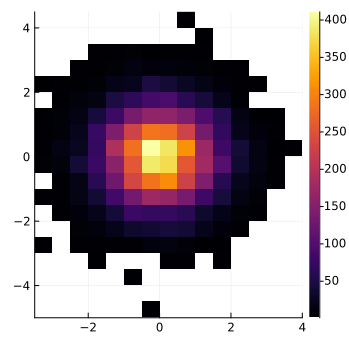

In [176]:
# Histograms can also be made in two dimensions

x = randn(10000)
y = randn(10000)
histogram2d(x, y, nbins=20, size=(350, 350))

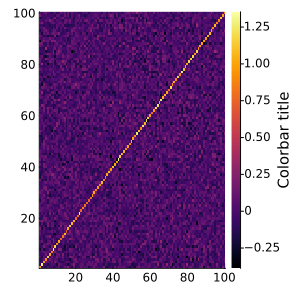

In [178]:
# Similarly, we can define a heatmap

data = randn(100, 100)
heatmap(1:100, 1:100, cov(data), colorbar_title="\nColorbar title", right_margin=15Plots.pt, size=(300, 300))

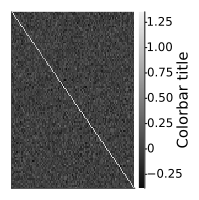

In [179]:
# The colormap or theme can be set by choosing from https://docs.juliaplots.org/latest/generated/colorschemes/
# I also often prefer to have (0, 0) at the top left, so I flip the y axis.
# The title of the colorbar can be set with 'colorbar_title'

heatmap(1:100, 1:100, cov(data), cmap=:grays, yflip=true, xticks=[], yticks=[], colorbar_title="\nColorbar title", right_margin=15Plots.pt, size=(200, 200))

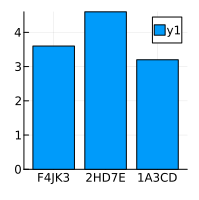

In [180]:
# Making a bar plot

data = Dict{String, Vector{Int}}("1A3CD" => [1, 4, 2, 4, 5], "2HD7E" => [6, 4, 3, 8, 2], "F4JK3" => [0, 4, 4, 5, 5]);
plot(collect(keys(data)), mean.(collect(values(data))), seriestype=:bar, size=(200, 200))
bar(collect(keys(data)), mean.(collect(values(data))), size=(200, 200))

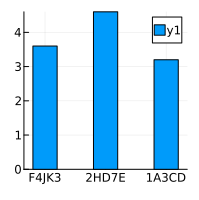

In [181]:
# You can change the width of the bars

bar(collect(keys(data)), mean.(collect(values(data))), bar_width=0.4, size=(200, 200))

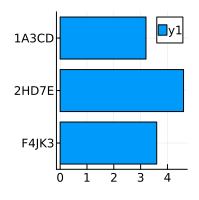

In [182]:
# You can make the bars horizontal too (by switching the x and y axis)

bar(collect(keys(data)), mean.(collect(values(data))), permute=(:x, :y), xlim=(0, 3), size=(200, 200))

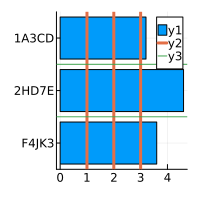

In [183]:
# To add horizontal/vertical lines to your plot, 'vline' and 'hline' make it easy:

vline!([1, 2, 3], linewidth=3)
hline!([1, 2])

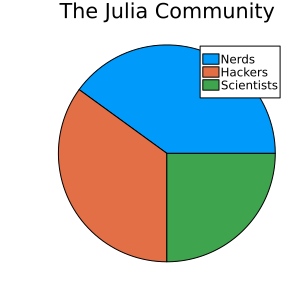

In [186]:
# Pie charts

x = ["Nerds", "Hackers", "Scientists"];
y = [0.4, 0.35, 0.25];
pie(x, y, title = "The Julia Community", size=(300, 300))

## TEXT ON PLOTS

You can specify font attributes like:
- family: "serif" or "sans-serif" or "monospace"
- pointsize: Size of font in points
- halign: Horizontal alignment (:hcenter, :left, or :right)
- valign: Vertical alignment (:vcenter, :top, or :bottom)
- rotation: Angle of rotation for text in degrees (use a non-integer type)
- color

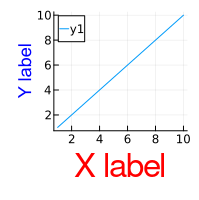

In [188]:
x = 1:10
y = x
plot(x, y, xlabel="X label", ylabel="Y label", xguidefont=font("Helvetica", 22, :red), yguidefont=font("Arial", 12, :blue), size=(200, 200))

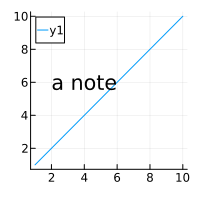

In [190]:
# You can place text anywhere on the plot using 'annotate!'

plot(x, y, size=(200, 200))
annotate!(4, 6, "a note")

   Resolving package versions...
  No Changes to `~/.julia/environments/v1.10/Project.toml`
  No Changes to `~/.julia/environments/v1.10/Manifest.toml`


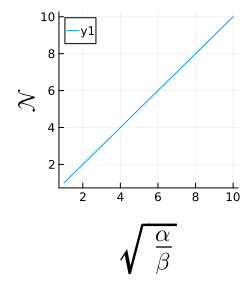

In [193]:
# If you want to use LaTeX symbols as part of your plots, import LaTeXStrings (https://github.com/JuliaStrings/LaTeXStrings.jl)
# Wrap your latex code into a string, and place it inside the 'latexstring' function
# If you are using any symbols, make sure to use DOUBLE backslack \\

Pkg.add("LaTeXStrings")
using LaTeXStrings

plot(x, y, xlabel="\n"*latexstring("\\sqrt{\\frac{\\alpha}{\\beta}}"), ylabel=latexstring("\\mathcal{N}"), size=(250, 300), guidefontsize=16)

## SAVING PLOTS

You can save your plot as `.png`, `.svg` or `.pdf`.
Use the `savefig` function to do so. 
Make sure you set the `dpi` high (300) to get high quality plots. 

If you want to save your text as text rather than shapes for `.svg` so you can edit in illustrator, make sure you set the fontfamily of all your fonts to `Helvetica`

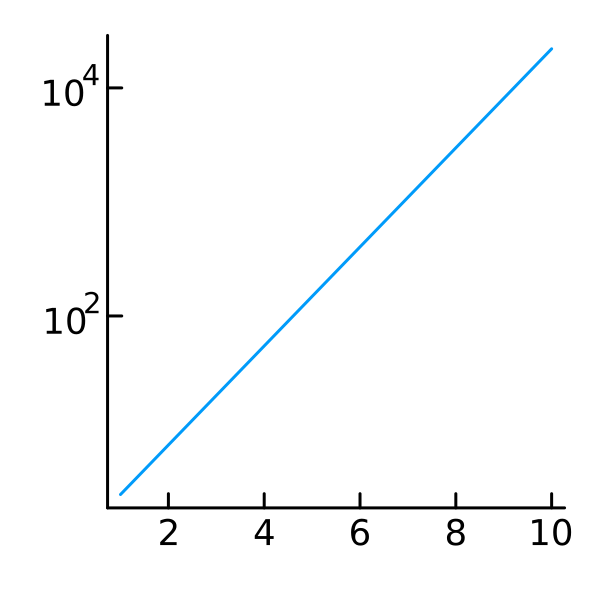

"/Users/jeroen/Documents/PhD projects/talks/Julia workshop/julia-workshop/example_plot.png"

In [196]:
display(plot(1:10, exp.(1:10), dpi=300, label="", grid=false, yscale=:log10, size=(200, 200)))
savefig("example_plot.png")

## StatsPlots.jl

https://docs.juliaplots.org/latest/generated/statsplots/

StatsPlots adds a few extra plots that are nice to have

In [197]:
Pkg.add("StatsPlots")
using StatsPlots

   Resolving package versions...
  No Changes to `~/.julia/environments/v1.10/Project.toml`
  No Changes to `~/.julia/environments/v1.10/Manifest.toml`


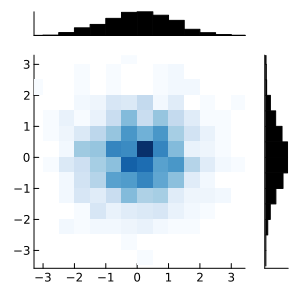

In [199]:
# For example, we can get the marginals of our 2D histogram with:
# (I like to pick colormaps that start at white so that they blend in with the background)

x = randn(1000)
y = randn(1000)
marginalhist(x, y, nbins=20, cmap=:Blues, size=(300, 300))

┌ Warning: Keyword argument `orientation` is deprecated.
│ Please use `permute` instead.
└ @ Plots /Users/jeroen/.julia/packages/Plots/ju9dp/src/args.jl:1552


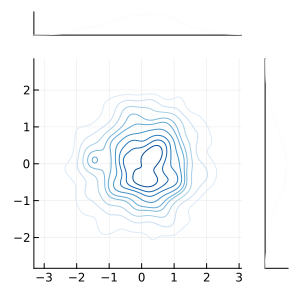

In [200]:
# Similarly, we can also plot the contours using kernel density estimates
# (levels sets how many contour levels to plot, code can take a second to run)

marginalkde(x, y, levels=10, cmap=:Blues, size=(300, 300))

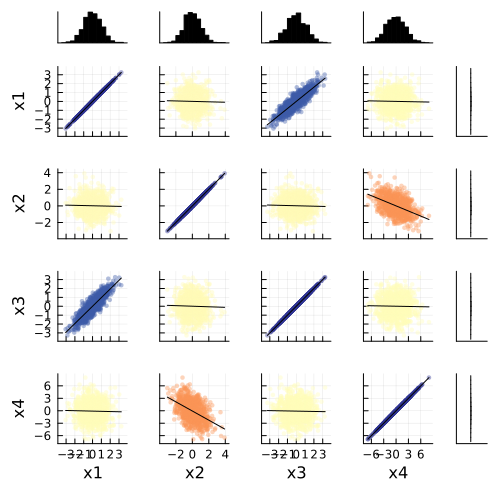

In [215]:
# If you have multiple variables and want to see their correlation, you can use cornerplot.

data = randn(1000, 4) #(imagine we have 4 measure, 1000 samples each)
data[:, 4] .= -data[:, 2] .+ 2*randn(1000) #(let's assume the second and fourth measure are weakly and negatively correlated)
data[:, 3] .= data[:, 1] .+ 0.5*randn(1000) #(let's assume the first and third measure are strongly correlated)

cornerplot(data, size=(500, 500), normalize=:probability)

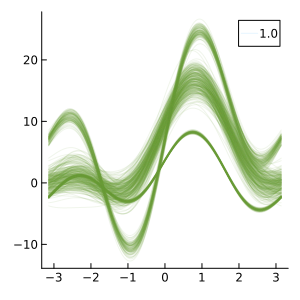

In [217]:
# Andrews plot is a way to look for structure in high dimensional data.
# We make our data such that there are three patters in it.
# You can see these in the Andrews plot, as well as their variability

data = randn(500, 4)
data[1:100, :] .= hcat([[1, 2, 3, 4] .+ 0.1*randn(4) for _ in 1:100]...)'
data[101:400, :] .= hcat([[7, 6, 5, 4] .+ randn(4) for _ in 1:300]...)'
data[401:end, :] .= hcat([[10, 10, 0, 10] .+ 0.5*randn(4) for _ in 1:100]...)'
andrewsplot(data, alpha=0.1, label="", grid=false, size=(300, 300))

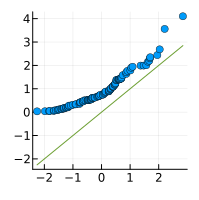

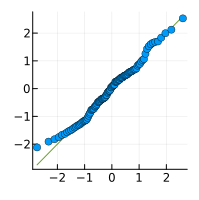

In [219]:
# qqplot is a good way to check if data is Normally distributed
# If you want to compare a distribution to the normal, use qqnorm

x = randn(100)
y = randexp(100)
display(qqplot(x, y, size=(200, 200)))
display(qqnorm(x, size=(200, 200)))

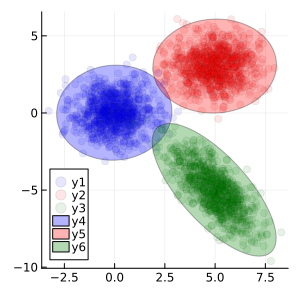

In [224]:
# covellipse lets you plot the covariance as an ellipse
# Multiply covariance by 3^2 to capture 3sd worth of data

data1 = randn(1000, 2)
data2 = [5 .+ randn(1000) 3 .+ randn(1000)]
data3 = [5 .+ randn(1000) randn(1000)]
data3[:, 2] = -data3[:, 1] + randn(1000)
scatter(data1[:, 1], data1[:, 2], alpha=0.1, c=:blue, size=(300, 300))
scatter!(data2[:, 1], data2[:, 2], alpha=0.1, c=:red)
scatter!(data3[:, 1], data3[:, 2], alpha=0.1, c=:green)
covellipse!(mean(data1, dims=1)[:], cov(data1).*9, c=:blue)
covellipse!(mean(data2, dims=1)[:], cov(data2).*9, c=:red)
covellipse!(mean(data3, dims=1)[:], cov(data3).*9, c=:green)

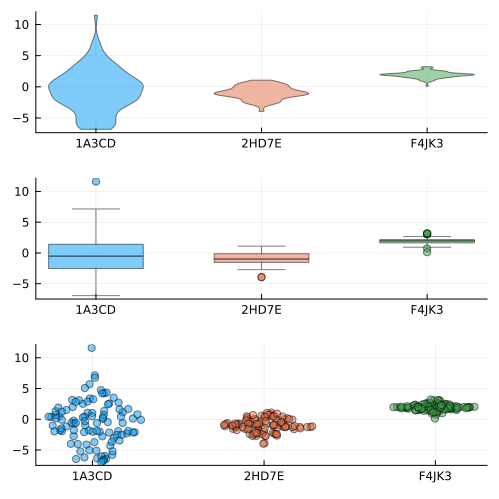

In [240]:
# To plot raw data across subjects, we can create
# violin, box and dot plots as follows:

subjects = ["1A3CD" "2HD7E" "F4JK3"]
data = [4*randn(100) -1 .+ randn(100) 2 .+ 0.5*randn(100)]
plot(layout=grid(3, 1), size=(500, 500))
violin!(subjects, sp=1, data, alpha=0.5, label="")
boxplot!(subjects, sp=2, data, alpha=0.5, label="")
dotplot!(subjects, sp=3, data, alpha=0.5, label="")
sleep(0.5)
plot!()

## ANIMATIONS

We can make animations very easily by using the `@animate` macro around a for loop that makes a plot every frame.

`gif` then turns the animation into a `.gif` and sets the frames-per-second (`fps`).

┌ Info: Saved animation to /var/folders/cm/mgs9k2l93dj5mvvwvbb_79740000gn/T/jl_zoLWLCLe9M.gif
└ @ Plots /Users/jeroen/.julia/packages/Plots/ju9dp/src/animation.jl:156


Plots.AnimatedGif("/var/folders/cm/mgs9k2l93dj5mvvwvbb_79740000gn/T/jl_zoLWLCLe9M.gif")
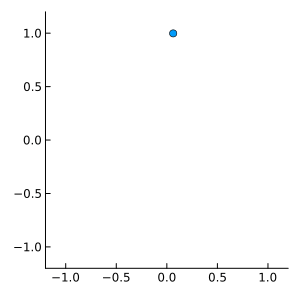

In [241]:
n = 100

anim = @animate for i ∈ 1:n
    x = sin.(i/n*2π)
    y = cos.(i/n*2π)
    scatter([x], [y], xlim=(-1.2, 1.2), ylim=(-1.2, 1.2), size=(300, 300), label=nothing, grid=false)
end;
gif(anim, fps = 30)

┌ Info: Saved animation to /var/folders/cm/mgs9k2l93dj5mvvwvbb_79740000gn/T/jl_5gNmnCXU1K.gif
└ @ Plots /Users/jeroen/.julia/packages/Plots/ju9dp/src/animation.jl:156


Plots.AnimatedGif("/var/folders/cm/mgs9k2l93dj5mvvwvbb_79740000gn/T/jl_5gNmnCXU1K.gif")
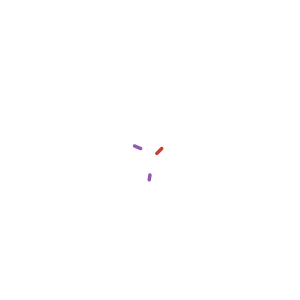

In [242]:
# Below is a more advanced animation:

function julia_icon_x(t; dir=:clockwise)
    x = 0
    if dir == :clockwise
        if t < 0.333
            x = sin.(t*2π*3*5/6 - 5π/6)
        elseif t < 0.666
            x = 1 .+ sin.((-(t-0.333)*2π*3*7/6) - π/6)
        else
            x = -1 .+ sin.((t-0.666)*2π*3*5/6 + π/2)
        end
    else
        if t < 0.333
            x = sin.(-t*2π*3*7/6 - 5π/6)
        elseif t < 0.666
            x = 1 .+ sin.(((t-0.333)*2π*3*5/6) - π/6)
        else
            x = -1 .+ sin.(-(t-0.666)*2π*3*7/6 + π/2)
        end
    end
    return x
end

function julia_icon_y(t; dir=:clockwise)
    y = 0
    if dir == :clockwise
        if t < 0.333
            y = 1 .+ cos.(t*2π*3*5/6 - 5π/6)
        elseif t < 0.666
            y = -(√3-1) .+ cos.((-(t-0.333)*2π*3*7/6) - π/6)
        else
            y = -(√3-1) .+ cos.((t-0.666)*2π*3*5/6 + π/2)
        end
    else
        if t < 0.333
            y = 1 .+ cos.(-t*2π*3*7/6 - 5π/6)
        elseif t < 0.666
            y = -(√3-1) .+ cos.(((t-0.333)*2π*3*5/6) - π/6)
        else
            y = -(√3-1) .+ cos.(-(t-0.666)*2π*3*7/6 + π/2)
        end
    end
    return y
end

n = 400 # number of frames
T = 15 # length of tail
colors = [[Colors.JULIA_LOGO_COLORS.green  for _ in 1:33]..., 
    [Colors.JULIA_LOGO_COLORS.red for _ in 1:33]..., 
    [Colors.JULIA_LOGO_COLORS.purple for _ in 1:34]...] # Julia logo colors


anim = @animate  for i ∈ 1:n
    plot()
    for k in 1:3 # three 'snakes'
        r = collect(maximum([0, i-T]):i) .+ 33*k # time points of each 'snake'
        x, y, c = zeros(length(r)), zeros(length(r)), zeros(RGB, length(r))
        for j in eachindex(r)
            dir = :clockwise
            ii = r[j]
            if 100 <= ii < 200 || 300 <= ii < 400
                dir = :anticlockwise
            end
            ii = (ii % 100) + 1
            x[j] = 0.5*julia_icon_x.(ii / (n/4), dir=dir)
            y[j] = 0.5*julia_icon_y.(ii / (n/4), dir=dir)
            c[j] = colors[ii]
        end
        linewidths = 4*reverse(1 .- collect(1:length(r)) ./ (T)) # Make snakes thin at one end
        plot!(x, y, xlim=(-2.2, 2.2), ylim=(-2.2, 2.2), label="", size=(300, 300), c=c, grid=false, axis=([], false), axes=false, linewidth=linewidths)
    end
end
gif(anim, fps=50)